幅広くデータを見ていく
* 加速度の波形を並べていみる
* ウィンドウフレームごとの平均，分散の変化

In [1]:
# 表示用
from tqdm import tqdm
from tqdm import tnrange, tqdm_notebook

In [2]:
import numpy as np
from numpy import zeros, newaxis
import datetime
import os
import copy
import time

# Parametor about Sensor
SensorNum=1 # Sensor number
#SensorAxis='AccX' # Axis

# Parametor about  " Sliding Window " 
WindowWidth =np.array([128,256,512,1024,2048,4096]) # Window Width
SlidingWidth =WindowWidth/4 #sliding window

# Parametor about Neural Network
AEDimention = 16

# Define Data Name
DATE= str( datetime.date.today() )+'/'
TITLE="Participants01_First_1/"

# Parametor about " Data Path"
DataPath = "/media/takeyama/Transfer/02_ActivityResearch/Paticipants01/01_First/20161018-105301/mem/"

#chopin
#StorePath = "/home/takeyama/Documents/"
#mozart
StorePath ="/media/takeyama/HD-PNFU3/01_ActivityResearchData/"
if not os.path.exists(StorePath+TITLE+'dictionary/'): 
    os.makedirs(StorePath+TITLE+'dictionary/')
DictionaryDataPath=StorePath+TITLE+'dictionary/'

if not os.path.exists(StorePath+TITLE+DATE+'window/'): 
    os.makedirs(StorePath+TITLE+DATE+'window/')
WindowDataPath=StorePath+TITLE+DATE+'window/'

if not os.path.exists(StorePath+TITLE+DATE+'studyOutput/'): 
    os.makedirs(StorePath+TITLE+DATE+'studyOutput/')
StudyOutputPath=StorePath+TITLE+DATE+'studyOutput/'

if not os.path.exists(StorePath+TITLE+DATE+'parametor/'): 
    os.makedirs(StorePath+TITLE+DATE+'parametor/')
ParametorPath=StorePath+TITLE+DATE+'parametor/'

if not os.path.exists(StorePath+TITLE+DATE+'result/'): 
    os.makedirs(StorePath+TITLE+DATE+'result/')
ResultPath=StorePath+TITLE+DATE+'result/'

if not os.path.exists(StorePath+'/'+TITLE+DATE+'graph/'): 
    os.makedirs(StorePath+'/'+TITLE+DATE+'graph/')
GraphPath=StorePath+'/'+TITLE+DATE+'graph/'

センサデータの読み込み

In [3]:
# センサデータのcsvファイル名をリストに集約する関数
def SensorDataFileNameList(path):
    l = os.listdir(DataPath)
    FilePath =[]
    SensorName = []
    
    for n in range(len(l)):
        if (l[n][:4].find('mem-') != -1):
            FilePath.append(l[n])
            SensorName.append(l[n][4:15])
    
    return FilePath,SensorName

CSVを読み込んで，CSVの中身を辞書型で表現する

In [4]:
def ImportCSV(csv_file,SensorName,mode='Round'):
    import pandas as pd
    '''
    ~Argument~
    csv_file -> ファイル名 
    mode Round -> 四捨五入
         Roundup -> 切り上げ
         Rounddown -> 切り捨て
    
    ~Conversion~
    Acc Data  [0.1mG]=>[G]
    Gyr Data  [0.01dps]=>[dps]   ...dps=degree per second
    '''
    # data dictionary 
    RawData={}   
    AccConversion = 0.1 * 0.001
    GyrConversion = 0.01
    
    # design dataframe and import csv
    data = pd.read_csv(csv_file)
    data.columns=[u'Type',u'Time',u'AccX',u'AccY',u'AccZ',u'GyrX',u'GyrY',u'GyrZ']
    data = data[ data['Type']=='ags']

    # convert numpy.darray 

    AccX=data.AccX.values*AccConversion
    AccY=data.AccY.values*AccConversion
    AccZ=data.AccZ.values*AccConversion
    
    GyrX=data.GyrX.values*GyrConversion
    GyrY=data.GyrY.values*GyrConversion
    GyrZ=data.GyrZ.values*GyrConversion

    # regist each raw data 
    RawData['AccX'] = AccX
    RawData['AccY'] = AccY
    RawData['AccZ'] = AccZ
    RawData['GyrX'] = GyrX
    RawData['GyrY'] = GyrY
    RawData['GyrZ'] = GyrZ
    RawData['Name'] = SensorName

    RawData['Time'] = data.Time.values

    return RawData

In [5]:
# FFT library
from scipy import fftpack
from scipy import signal

# Graph Plot
import matplotlib.pyplot as plt
from matplotlib import gridspec

# Generate WindowFrame Function
from mymodule import window

# timer
import time

%matplotlib inline

In [6]:
DictName=os.listdir(DictionaryDataPath)

In [7]:
Sensor1 = np.load(DictionaryDataPath+DictName[0])['data'][()]
Sensor2 = np.load(DictionaryDataPath+DictName[1])['data'][()]
Sensor3 = np.load(DictionaryDataPath+DictName[2])['data'][()]
Sensor4 = np.load(DictionaryDataPath+DictName[3])['data'][()]
Sensor5 = np.load(DictionaryDataPath+DictName[4])['data'][()]
Sensor6 = np.load(DictionaryDataPath+DictName[5])['data'][()]

グラフプロットする

In [8]:
import matplotlib.pyplot as plt
%matplotlib inline

In [9]:
def MakingGraphPath(p):
    if not os.path.exists(GraphPath+p): 
        os.makedirs(GraphPath+p)
    ThisGraphPath=GraphPath+p
    return ThisGraphPath

まずは，すべてのセンサデータの加速度Ｘを並べて表示する

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

ThisGraphPath = MakingGraphPath('SensorALL/Wave_AccX')

for PltRng in tqdm_notebook(range(0,1077000,1000),leave=False,mininterval=5):
    ax.plot(range(PltRng,PltRng+1000), Sensor1['AccX'][PltRng:PltRng+1000],label='Sensor1')
    ax.plot(range(PltRng,PltRng+1000), Sensor2['AccX'][PltRng:PltRng+1000],label='Sensor2')
    ax.plot(range(PltRng,PltRng+1000), Sensor3['AccX'][PltRng:PltRng+1000],label='Sensor3')
    ax.plot(range(PltRng,PltRng+1000), Sensor4['AccX'][PltRng:PltRng+1000],label='Sensor4')
    ax.plot(range(PltRng,PltRng+1000), Sensor5['AccX'][PltRng:PltRng+1000],label='Sensor5')
    ax.plot(range(PltRng,PltRng+1000), Sensor6['AccX'][PltRng:PltRng+1000],label='Sensor6')

    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1~6_AccX"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7))


    filename = "Participants01_Sensor1~6_AccX"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.1)

ウィンドウフレームごとのグラフ

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

w=window()
w.SetData('AccX',Sensor1['AccX'])
wind=w.Compile(windowWidth=32,slidingWidth=16)


ThisGraphPath = MakingGraphPath('Sensor1/Wave_AccX/')

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33683,32*RngPlotGraph)):
    for i in range(0,RngPlotGraph):
        MIN = wind[PltRng+i,:32].min()
        MAX = wind[PltRng+i,:32].max()
        ax.plot(range(i*32,(i+1)*32), wind[PltRng+i,:32],label='Sensor1'+'WindNum'+str(i))
        ax.plot([i*32, i*32], [MIN,MAX ], 'k-', lw=2)
    
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccX_Each_WindFrame"+str(PltRng).zfill(7)+'-'+str(PltRng+32*20).zfill(7))
    ax.set_ylabel("Sensor1 AccX")

    filename = "Participants01_Sensor1_AccX_Each_WindFrame"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.01)

ウィンドウフレームごとの平均値の変化

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

w=window()
w.SetData('AccX',Sensor1['AccX'])
wind=w.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Mean_AccX/')

RngPlotGraph = 100 # 100枚ごとにグラフを作成する

for PltRng in tqdm_notebook( range(0,33600,RngPlotGraph),leave=False,mininterval=1):
    Avrg=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        Avrg = np.append(Avrg,wind[i,:].mean() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), Avrg[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccX_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.set_xlabel("windowFrame Number")
    ax.set_ylabel("windowFrame Mean")

    filename = "Participants01_Sensor1_AccX_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()

    ax.clear()
    time.sleep(1)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

w=window()
w.SetData('AccX',Sensor1['AccX'])
wind=w.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Variance_AccX/')

RngPlotGraph = 100 # 100枚ごとにグラフを作成する

for PltRng in tqdm_notebook( range(0,33600,RngPlotGraph),leave=False,mininterval=1):
    Var=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        Var = np.append(Var,wind[i,:].var() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), Var[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccX_Each_WindFrame_Variance"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.set_xlabel("windowFrame Number")
    ax.set_ylabel("windowFrame Mean")

    filename = "Participants01_Sensor1_AccX_Each_WindFrame_Variance"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()

    ax.clear()
    time.sleep(1)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

w=window()
w.SetData('AccX',Sensor1['AccX'])
wind=w.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Median_AccX/')

RngPlotGraph = 100 # 100枚ごとにグラフを作成する

for PltRng in tqdm_notebook( range(0,33600,RngPlotGraph),leave=False,mininterval=1):
    Var=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        Var = np.append(Var,np.median( wind[i,:]) )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), Var[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccX_Each_WindFrame_Median"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.set_xlabel("windowFrame Number")
    ax.set_ylabel("windowFrame Mean")

    filename = "Participants01_Sensor1_AccX_Each_WindFrame_Median"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()

    ax.clear()
    time.sleep(1)

とりあえず，テストとしてＬｅｆｔＨａｎｄのセンサのメディアン，平均，分散を出したのでSensor1の全軸の統計量のグラフを出す

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

wS1X=window()
wS1Y=window()
wS1Z=window()

wS1X.SetData('AccX',Sensor1['AccX'])
wS1Y.SetData('AccY',Sensor1['AccY'])
wS1Z.SetData('AccZ',Sensor1['AccZ'])

windS1X=wS1X.Compile(windowWidth=32,slidingWidth=16)
windS1Y=wS1Y.Compile(windowWidth=32,slidingWidth=16)
windS1Z=wS1Z.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Wave_AccXYZ/')

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33683,32*RngPlotGraph)):
    for i in range(0,RngPlotGraph):
        MIN1X = windS1X[PltRng+i,:32].min()
        MAX1X = windS1X[PltRng+i,:32].max()
        ax.plot(range(i*32,(i+1)*32), windS1X[PltRng+i,:32],label='Sensor1_AccX'+'WindNum'+str(i))
        ax.plot([i*32, i*32], [MIN1X,MAX1X], 'k-', lw=2)
        
        MIN1Y = windS1Y[PltRng+i,:32].min()
        MAX1Y = windS1Y[PltRng+i,:32].max()
        ax.plot(range(i*32,(i+1)*32), windS1Y[PltRng+i,:32],label='Sensor1_AccY'+'WindNum'+str(i))
        ax.plot([i*32, i*32], [MIN1Y,MAX1Y], 'k-', lw=2)
        
        MIN1Z = windS1Z[PltRng+i,:32].min()
        MAX1Z = windS1Z[PltRng+i,:32].max()
        ax.plot(range(i*32,(i+1)*32), windS1Z[PltRng+i,:32],label='Sensor1_AccZ'+'WindNum'+str(i))
        ax.plot([i*32, i*32], [MIN1Z,MAX1Z], 'k-', lw=2)
    
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccXYZ_Each_WindFrame"+str(PltRng).zfill(7)+'-'+str(PltRng+32*20).zfill(7))
    ax.set_ylabel("Sensor1 Accelemetor")

    filename = "Participants01_Sensor1_AccXYZ"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.01)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccY')

ThisGraphPath = MakingGraphPath('SensorALL/Wave_AccY/')

for PltRng in tqdm_notebook(range(0,1077000,1000),leave=False,mininterval=1):
    ax.plot(range(PltRng,PltRng+1000), Sensor1['AccY'][PltRng:PltRng+1000],label='Sensor1')
    ax.plot(range(PltRng,PltRng+1000), Sensor2['AccY'][PltRng:PltRng+1000],label='Sensor2')
    ax.plot(range(PltRng,PltRng+1000), Sensor3['AccY'][PltRng:PltRng+1000],label='Sensor3')
    ax.plot(range(PltRng,PltRng+1000), Sensor4['AccY'][PltRng:PltRng+1000],label='Sensor4')
    ax.plot(range(PltRng,PltRng+1000), Sensor5['AccY'][PltRng:PltRng+1000],label='Sensor5')
    ax.plot(range(PltRng,PltRng+1000), Sensor6['AccY'][PltRng:PltRng+1000],label='Sensor6')

    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1~6_AccY"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7))


    filename = "Participants01_Sensor1~6_AccY"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.1)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccZ')

ThisGraphPath = MakingGraphPath('SensorALL/Wave_AccZ/')

for PltRng in tqdm_notebook(range(0,1077000,1000),leave=False,mininterval=5):
    ax.plot(range(PltRng,PltRng+1000), Sensor1['AccZ'][PltRng:PltRng+1000],label='Sensor1')
    ax.plot(range(PltRng,PltRng+1000), Sensor2['AccZ'][PltRng:PltRng+1000],label='Sensor2')
    ax.plot(range(PltRng,PltRng+1000), Sensor3['AccZ'][PltRng:PltRng+1000],label='Sensor3')
    ax.plot(range(PltRng,PltRng+1000), Sensor4['AccZ'][PltRng:PltRng+1000],label='Sensor4')
    ax.plot(range(PltRng,PltRng+1000), Sensor5['AccZ'][PltRng:PltRng+1000],label='Sensor5')
    ax.plot(range(PltRng,PltRng+1000), Sensor6['AccZ'][PltRng:PltRng+1000],label='Sensor6')

    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1~6_AccZ"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7))


    filename = "Participants01_Sensor1~6_AccZ"+str( PltRng ).zfill(7)+'-'+str( PltRng+1000 ).zfill(7)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.1)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccY')

w=window()
w.SetData('AccY',Sensor1['AccY'])
wind=w.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Mean_AccY/')

RngPlotGraph = 100 # 100枚ごとにグラフを作成する

for PltRng in tqdm_notebook( range(0,33600,RngPlotGraph),leave=False,mininterval=1):
    Avrg=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        Avrg = np.append(Avrg,wind[i,:].mean() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), Avrg[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccY_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.set_xlabel("windowFrame Number")
    ax.set_ylabel("windowFrame Mean")

    filename = "Participants01_Sensor1_AccY_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5)+".png"
    ax.figure.savefig(ThisGraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()

    ax.clear()
    time.sleep(1)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccZ')

w=window()
w.SetData('AccZ',Sensor1['AccZ'])
wind=w.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Mean_AccZ/')

RngPlotGraph = 100 # 100枚ごとにグラフを作成する

for PltRng in tqdm_notebook( range(0,33600,RngPlotGraph),leave=False,mininterval=1):
    Avrg=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        Avrg = np.append(Avrg,wind[i,:].mean() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), Avrg[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    ax.set_title("Participants01_Sensor1_AccZ_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.set_xlabel("windowFrame Number")
    ax.set_ylabel("windowFrame Mean")

    filename = "Participants01_Sensor1_AccZ_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5)+".png"
    ax.figure.savefig(GraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()

    ax.clear()
    time.sleep(1)

上記のように各軸ごとに平均，分散といった統計量を出すよりも１つにまとめてしまったほうがいいのかもしれない

各軸ごとに行うことのメリット
* Ｙ軸のレンジが狭めることによって見やすくなる
* 見やすくなることで様々な分析をすることが可能である

3軸まとめてグラフ化することによるメリット
* 各軸との関係性が見やすくなる

３軸の平均をまとめる

  8%|▊         | 2782/33682 [00:00<00:01, 27809.48it/s]

AccX is registed now
AccY is registed now
AccZ is registed now
Build Complete
Source shape is(1077870,)
window frames num =33682
offset=14


 71%|███████▏  | 24014/33682 [00:07<00:07, 1299.45it/s]


KeyboardInterrupt: 

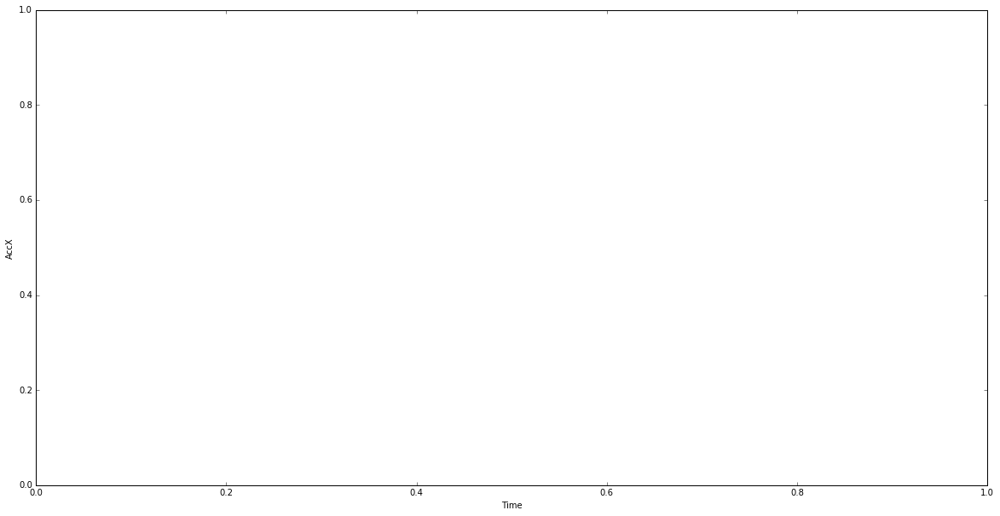

In [10]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

wS1X=window()
wS1Y=window()
wS1Z=window()

wS1X.SetData('AccX',Sensor1['AccX'])
wS1Y.SetData('AccY',Sensor1['AccY'])
wS1Z.SetData('AccZ',Sensor1['AccZ'])

windS1X=wS1X.Compile(windowWidth=32,slidingWidth=16)
windS1Y=wS1Y.Compile(windowWidth=32,slidingWidth=16)
windS1Z=wS1Z.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Mean_AccXYZ/')

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33683,32*RngPlotGraph)):
    AvrgS1X=np.array([])
    AvrgS1Y=np.array([])
    AvrgS1Z=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        AvrgS1X = np.append(AvrgS1X,windS1X[i,:].mean() )
        AvrgS1Y = np.append(AvrgS1Y,windS1Y[i,:].mean() )
        AvrgS1Z = np.append(AvrgS1Z,windS1Z[i,:].mean() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1X[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Y[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Z[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)
    
    ax.set_title("Participants01_Sensor1_AccXYZ_Each_WindFrame_Mean"+str(PltRng).zfill(7)+'-'+str(PltRng+32*20).zfill(7))
    ax.set_ylabel("Sensor1 Accelemetor")

    filename = "Participants01_Sensor1_AccXYZ_Each_WindFrame_Mean"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    ax.figure.savefig(GraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.01)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

wS1X=window()
wS1Y=window()
wS1Z=window()

wS1X.SetData('AccX',Sensor1['AccX'])
wS1Y.SetData('AccY',Sensor1['AccY'])
wS1Z.SetData('AccZ',Sensor1['AccZ'])

windS1X=wS1X.Compile(windowWidth=32,slidingWidth=16)
windS1Y=wS1Y.Compile(windowWidth=32,slidingWidth=16)
windS1Z=wS1Z.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Variance_AccXYZ/')

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33683,32*RngPlotGraph)):
    AvrgS1X=np.array([])
    AvrgS1Y=np.array([])
    AvrgS1Z=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        AvrgS1X = np.append(AvrgS1X,windS1X[i,:].var() )
        AvrgS1Y = np.append(AvrgS1Y,windS1Y[i,:].var() )
        AvrgS1Z = np.append(AvrgS1Z,windS1Z[i,:].var() )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1X[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Y[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Z[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)
    
    ax.set_title("Participants01_Sensor1_AccXYZ_Each_WindFrame_Variance"+str(PltRng).zfill(7)+'-'+str(PltRng+32*20).zfill(7))
    ax.set_ylabel("Sensor1 Accelemetor")

    filename = "Participants01_Sensor1_AccXYZ_Each_WindFrame_Variance"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    ax.figure.savefig(GraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.01)

In [ ]:
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111)

ax.set_xlabel('Time')
ax.set_ylabel('AccX')

wS1X=window()
wS1Y=window()
wS1Z=window()

wS1X.SetData('AccX',Sensor1['AccX'])
wS1Y.SetData('AccY',Sensor1['AccY'])
wS1Z.SetData('AccZ',Sensor1['AccZ'])

windS1X=wS1X.Compile(windowWidth=32,slidingWidth=16)
windS1Y=wS1Y.Compile(windowWidth=32,slidingWidth=16)
windS1Z=wS1Z.Compile(windowWidth=32,slidingWidth=16)

ThisGraphPath = MakingGraphPath('Sensor1/Median_AccXYZ/')

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33683,32*RngPlotGraph)):
    AvrgS1X=np.array([])
    AvrgS1Y=np.array([])
    AvrgS1Z=np.array([])

    for i in range(PltRng,PltRng+RngPlotGraph):
        AvrgS1X = np.append(AvrgS1X,np.median( windS1X[i,:] ) )
        AvrgS1Y = np.append(AvrgS1Y,np.median( windS1Y[i,:] ) )
        AvrgS1Z = np.append(AvrgS1Z,np.median( windS1Z[i,:] ) )
        
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1X[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Y[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    ax.plot(range(i*RngPlotGraph,(i+1)*RngPlotGraph), AvrgS1Z[:RngPlotGraph],label='Sensor1'+'WindNum'+str(PltRng).zfill(5)+'-'+str(PltRng+RngPlotGraph).zfill(5))
    
    lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)
    
    ax.set_title("Participants01_Sensor1_AccXYZ_Each_WindFrame_Median"+str(PltRng).zfill(7)+'-'+str(PltRng+32*20).zfill(7))
    ax.set_ylabel("Sensor1 Accelemetor")

    filename = "Participants01_Sensor1_AccXYZ_Each_WindFrame_Median"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    ax.figure.savefig(GraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')

    plt.show()
    
    ax.clear()
    time.sleep(0.01)

# ちょっとした分析アイデア1
[R,G,B]=[平均，分散，中央値]とした際の画像を作ってみる

  9%|▉         | 2984/33682 [00:00<00:01, 29824.17it/s]

AccX is registed now
AccY is registed now
AccZ is registed now
Build Complete
Source shape is(1077870,)
window frames num =33682
offset=14


  9%|▊         | 2908/33682 [00:00<00:01, 29064.92it/s]

Build Complete
Source shape is(1077870,)
window frames num =33682
offset=14


  9%|▊         | 2914/33682 [00:00<00:01, 29138.57it/s]

Build Complete
Source shape is(1077870,)
window frames num =33682
offset=14


100%|██████████| 33682/33682 [00:14<00:00, 2246.36it/s]


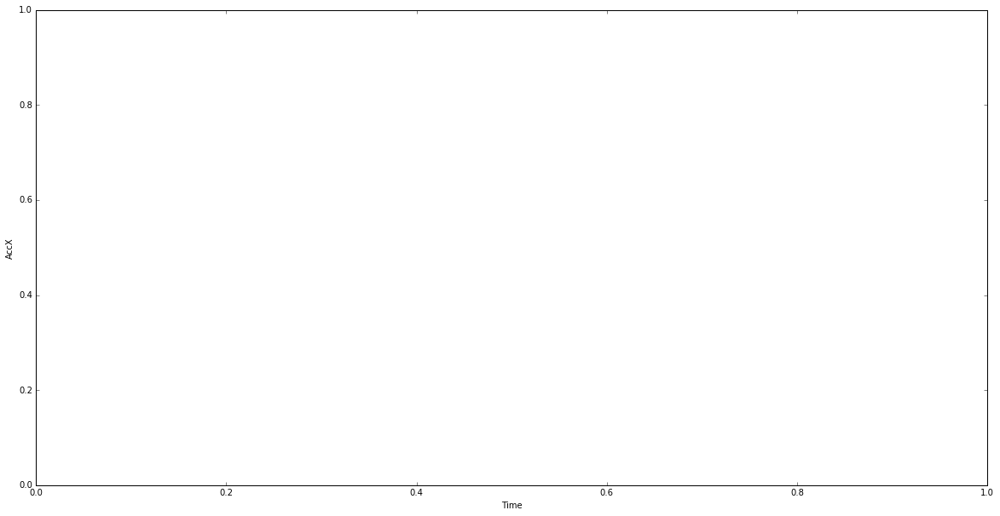

In [11]:
fig = plt.figure(figsize=(20,10))

plt.xlabel('Time')
plt.ylabel('AccX')

# making window frame
wS1X=window()
wS1Y=window()
wS1Z=window()

wS1X.SetData('AccX',Sensor1['AccX'])
wS1Y.SetData('AccY',Sensor1['AccY'])
wS1Z.SetData('AccZ',Sensor1['AccZ'])

windS1X=wS1X.Compile(windowWidth=32,slidingWidth=16)
windS1Y=wS1Y.Compile(windowWidth=32,slidingWidth=16)
windS1Z=wS1Z.Compile(windowWidth=32,slidingWidth=16)

GoalOutput = np.zeros(( 3,10))

RngPlotGraph = 10
for PltRng in tqdm_notebook( xrange(0,33680,RngPlotGraph)):
    AvrgS1X=np.array([])
    AvrgS1Y=np.array([])
    AvrgS1Z=np.array([])
    
    VarS1X=np.array([])
    VarS1Y=np.array([])
    VarS1Z=np.array([])
    
    MedS1X=np.array([])
    MedS1Y=np.array([])
    MedS1Z=np.array([])
    
    imgS1X=np.array([])
    imgS1Y=np.array([])
    imgS1Z=np.array([])
    
    img=np.array([])
    
    # calcurate Mean
    for i in range(PltRng,PltRng+RngPlotGraph):
        AvrgS1X = np.append(AvrgS1X,windS1X[i,:].mean() )/255
        AvrgS1Y = np.append(AvrgS1Y,windS1Y[i,:].mean() )/255
        AvrgS1Z = np.append(AvrgS1Z,windS1Z[i,:].mean() )/255
    
    # calcurate Variant
    for i in range(PltRng,PltRng+RngPlotGraph):
        VarS1X = np.append(VarS1X,windS1X[i,:].var() )/255
        VarS1Y = np.append(VarS1Y,windS1Y[i,:].var() )/255
        VarS1Z = np.append(VarS1Z,windS1Z[i,:].var() )/255
        
    # calcurate Median
    for i in range(PltRng,PltRng+RngPlotGraph):
        MedS1X = np.append(MedS1X,np.median(windS1X[i,:]) )/255
        MedS1Y = np.append(MedS1Y,np.median(windS1Y[i,:]) )/255
        MedS1Z = np.append(MedS1Z,np.median(windS1Z[i,:]) )/255
        
    imgS1X = np.hstack( (imgS1X,AvrgS1X))
    imgS1X = np.hstack( (imgS1X,VarS1X))
    imgS1X = np.hstack( (imgS1X,MedS1X))

    imgS1Y = np.hstack( (imgS1Y,AvrgS1Y))
    imgS1Y = np.hstack( (imgS1Y,VarS1Y))
    imgS1Y = np.hstack( (imgS1Y,MedS1Y))
    
    imgS1Z = np.hstack( (imgS1Z,AvrgS1Z))
    imgS1Z = np.hstack( (imgS1Z,VarS1Z))
    imgS1Z = np.hstack( (imgS1Z,MedS1Z))
    
    img=np.vstack( (imgS1X,imgS1Y) )
    img=np.vstack( (img,imgS1Z) )
    
    GoalOutput = np.hstack( (GoalOutput,img) )
         
    #lgnd=ax.legend(bbox_to_anchor=(1.05, 0.5), loc='lower left', borderaxespad=0)

    filename = "Participants01_Sensor1_AccXY_StatisticalValue_to_Image"+str(PltRng).zfill(5)+'-'+str(PltRng+32*50).zfill(5)+".png"
    #ax.figure.savefig(GraphPath+filename,bbox_extra_artists=(lgnd,), bbox_inches='tight')    
    #ax.clear()
    time.sleep(0.01)
    
GoalOutput=GoalOutput[:,:,newaxis]
GoalOutput=GoalOutput[:,:101040,:]

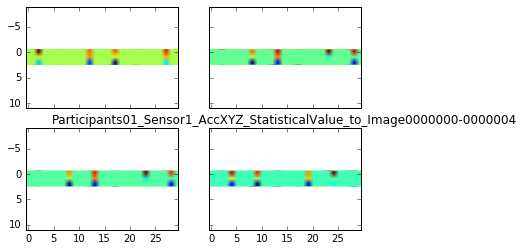

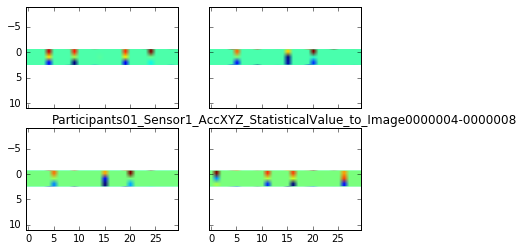

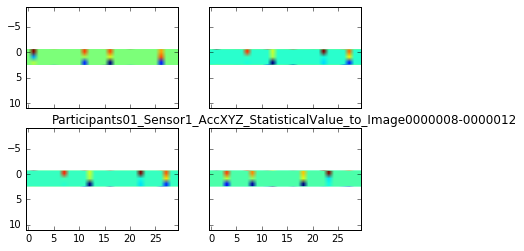

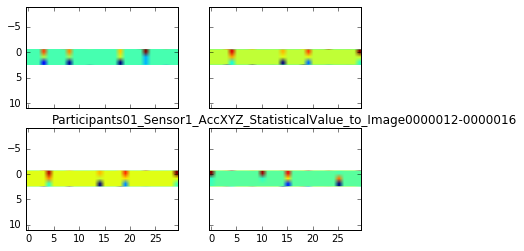

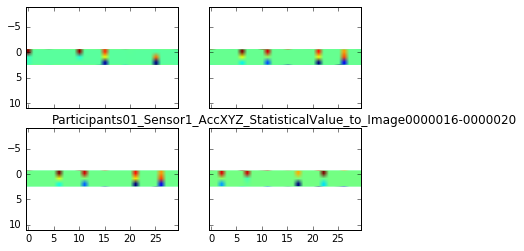

...

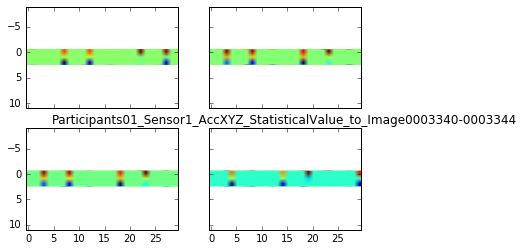

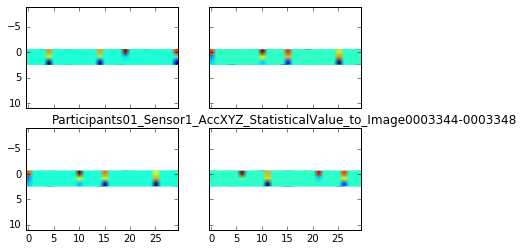

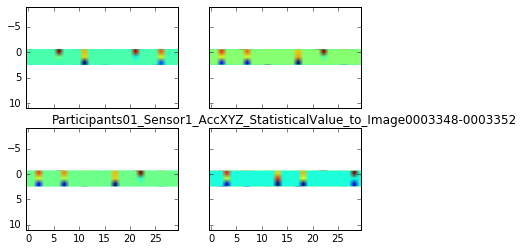

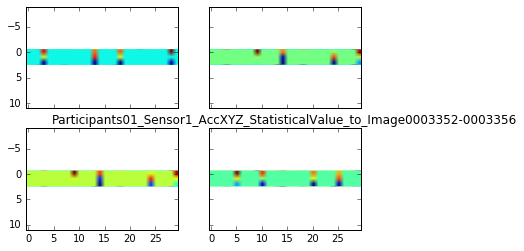

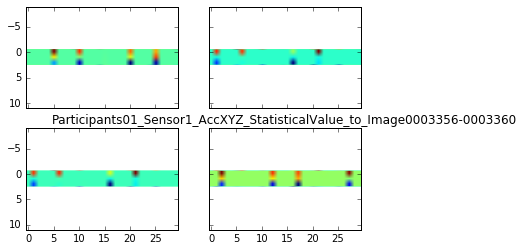

In [13]:
ThisGraphPath = MakingGraphPath('Sensor1/StatisValue2Image/')

Image = GoalOutput.reshape(3,30,101040/30)

fig=plt.figure(figsize=(4,3))

for COUNT in tqdm_notebook( range(0,3360,4) ):
    f, ((fig1, fig2), (fig3, fig4)) = plt.subplots(2, 2, sharex='col', sharey='row')
    
    for i in range(4):
        fig1.imshow(Image[:,:,COUNT+i])
        fig2.imshow(Image[:,:,COUNT+i+1])
        fig3.imshow(Image[:,:,COUNT+i+2])
        fig4.imshow(Image[:,:,COUNT+i+3])
        
    plt.title("Participants01_Sensor1_AccXYZ_StatisticalValue_to_Image"+str(COUNT).zfill(7)+'-'+str(COUNT+4).zfill(7))
    
    FileName ="Participants01_Sensor1_AccXYZ_StatisticalValue_to_Image"+str(COUNT).zfill(7)+'-'+str(COUNT+4)+'.png'
    
    plt.savefig(ThisGraphPath+FileName)
    plt.show()
    time.sleep(1)

In [ ]:
print     FileName